# Convolution layer visualization

In [1]:
import os

os.environ["KERAS_BACKEND"] = "tensorflow"
os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from keras.api.utils import image_dataset_from_directory
import numpy as np
import tensorflow as tf
import keras
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import pandas as pd

DATA_PATH = os.path.join(os.getcwd(), "..", "data")
MODEL_PATH = os.path.join(os.getcwd(), "..", "models")
LOG_DIR = os.path.join(os.getcwd(), "..", "logs")

2024-12-12 15:13:21.156841: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-12-12 15:13:21.385732: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1734012801.472290    7447 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1734012801.497007    7447 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-12 15:13:21.705165: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
dataset_path = os.path.join(DATA_PATH, "kaggle-speech-recognition")
batch_size = 32
class_names = next(os.walk(os.path.join(dataset_path, "train")))[1]
class_dict = dict(zip(class_names, range(len(class_names))))

ds_valid: tf.data.Dataset  = image_dataset_from_directory(os.path.join(dataset_path, "validation"), color_mode="grayscale",
                                        label_mode="categorical", batch_size=batch_size, class_names=class_names,
                                        seed=42, validation_split=0.0)

ds_valid = ds_valid.prefetch(tf.data.AUTOTUNE)

Found 6798 files belonging to 30 classes.


I0000 00:00:1734012805.338032    7447 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 3586 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 3060 Laptop GPU, pci bus id: 0000:01:00.0, compute capability: 8.6


In [3]:
model: keras.Model = keras.saving.load_model(os.path.join(MODEL_PATH, "NormalizedCNN.keras"))
model.summary()

Model: "NormalizedCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (32, 256, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_14 (Reshape)            │ (32, 256, 256, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization_18                │ (32, 256, 256, 1)      │             3 │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (32, 254, 254, 16)     │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (32, 84, 84, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (32, 83, 83, 64)       │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (32, 41, 41, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (32, 40, 40, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_14            │ (32, 20, 20, 128)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (32, 51200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (32, 256)              │    13,107,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (32, 256)              │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (32, 30)               │         7,710 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,218,178 (50.42 MB)

 Trainable params: 13,218,174 (50.42 MB)

 Non-trainable params: 3 (16.00 B)

 Optimizer params: 1 (8.00 B)

In [4]:
activations = [keras.Model(inputs=model.input, outputs=layer.output, name=layer.name) for layer in model.layers if "conv" in layer.name]

In [5]:
activations

[<Functional name=conv2d_42, built=True>,
 <Functional name=conv2d_43, built=True>,
 <Functional name=conv2d_44, built=True>]

## Data exploration

In [6]:
y_true = []
y_prob = []

for X, y in ds_valid:
    y_true.append(y)
    y_prob.append(model.predict(X, verbose=0))

y_true = np.argmax(np.concatenate(y_true), axis=-1)
y_prob = np.concatenate(y_prob)
y_pred = np.argmax(y_prob, axis=-1)

I0000 00:00:1733764270.580290    1512 service.cc:148] XLA service 0x7f7264003800 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1733764270.580976    1512 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-12-09 18:11:10.598295: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1733764270.644465    1512 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1733764272.891510    1512 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
2024-12-09 18:11:24.887043: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


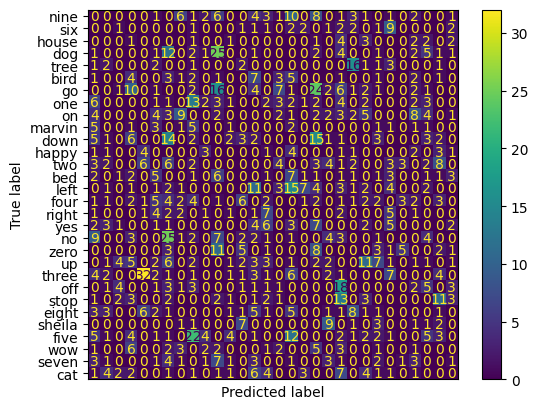

In [7]:
cm = confusion_matrix(y_true, y_pred)
cm_no_diag = cm - np.diag(np.diag(cm))
disp = ConfusionMatrixDisplay(cm_no_diag, display_labels=class_names)
disp.plot()
plt.xticks([])
plt.show()

In [8]:
confusing_pairs = [(class_names[i//30], class_names[i % 30], int(cm[i//30, i%30] + cm[i%30, i//30]))
              for i in np.flip(np.argsort(cm_no_diag + cm_no_diag.T, axis=None)) if i % 30 < i // 30]
print(confusing_pairs[:6])

[('no', 'go', 49), ('three', 'tree', 48), ('down', 'dog', 31), ('five', 'on', 30), ('down', 'go', 30), ('off', 'up', 29)]


Let's look at the most interesting pairs of labels.

In [9]:
cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
labels = ["no", "go", "three", "tree", "down", "dog", "five", "on", "off", "up"]
valuable_labels = cm_df[labels].loc[labels]
valuable_labels

,no,go,three,tree,down,dog,five,on,off,up
no,205,25,0,0,7,3,0,2,0,3
go,24,179,1,0,16,10,2,2,2,6
three,0,1,180,32,0,0,0,1,0,1
tree,0,0,16,136,0,0,0,1,1,0
down,15,14,0,0,204,6,0,2,0,1
dog,2,12,0,0,25,111,2,2,0,4
five,0,1,1,0,0,4,171,22,2,2
on,2,3,2,0,2,0,8,205,5,3
off,0,3,0,0,0,0,2,3,211,18
up,2,6,0,0,0,5,1,2,11,204


In [10]:
def print_activation(y: np.ndarray, title: str, cmap = None, colorbar = False):
    if len(y.shape) == 4:
        assert len(y) == 1
        y = np.squeeze(y, axis=0)
    filters = y.shape[-1]
    cols = int(filters**(0.5))
    rows = filters // cols
    plt.figure(figsize=(10, 10))
    gs = gridspec.GridSpec(rows, rows)
    gs.update(wspace=0.025, hspace=0.05) # set the spacing between axes.
    for row in range(rows):
        for col in range(cols):
            ax = plt.subplot(gs[row * cols + col])
            ax.set_axis_off()
            ax.imshow(y[:, :, row * cols + col], cmap=cmap)
            ax.set_aspect('equal')
            ax.set_xticklabels([])
            ax.set_yticklabels([])
            ax.set_aspect('equal')
    plt.suptitle(title, fontsize=20)
    if colorbar:
        plt.colorbar()
    plt.show()

In [11]:
def compute_activations(X: np.ndarray, activations: list[keras.Model]):
    assert len(X) == 1
    return [activation.predict(X, batch_size=1, verbose=0) for activation in activations]

In [12]:
def compute_average_activations(X: np.ndarray, activations: list[keras.Model], batch_size=32):
    avg_activations = []

    for activation in activations:
        y_activation = []
        avg_weights = []
        for batch in np.array_split(X, np.arange(batch_size, len(X), batch_size)):
            pred = activation.predict(batch, verbose=0)
            avg_weights.append(len(batch))
            y_activation.append(np.average(pred, axis=0))

        y_activation = np.array(y_activation)
        avg_activation = np.average(y_activation, axis=0, weights=avg_weights)
        avg_activations.append(avg_activation)

    return avg_activations

In [8]:
def get_samples_from_class(ds: tf.data.Dataset, class_name: str):
    samples = []
    for X, y in ds.as_numpy_iterator():
        y_idx = np.argmax(y, axis=-1)
        samples.append(X[[i for i in range(len(y)) if class_names[y_idx[i]] == class_name]])

    return np.concatenate(samples)

In [7]:
def correct_incorrect_split(model: keras.Model, ds: tf.data.Dataset, labels: list[str]) -> tuple[dict[str, np.ndarray], dict[str, np.ndarray]]:
    assert len(labels) == 2
    X = {}
    y_prob = {}
    y_pred = {}
    correct = {}
    incorrect = {}

    for label in labels:
        X[label] = get_samples_from_class(ds, label)
        X[label] = get_samples_from_class(ds, label)

    for label in X:
        y_prob[label] = model.predict(X[label], batch_size=32, verbose=0)
        y_pred[label] = np.argmax(y_prob[label], axis=-1)

    for label in y_pred:
        for class_name in y_pred:
            if label == class_name:
                correct[label] = X[label][y_pred[label] == class_dict[class_name]]
            else:
                incorrect[label] = X[label][y_pred[label] == class_dict[class_name]]

    return correct, incorrect

In [15]:
def get_diff_avg_activaions(correct_conv_avgs: list[np.ndarray], incorrect_conv_avgs: list[np.ndarray]):
    eps = 1e-6
    diff_avgs = []
    for corr, incorr in zip(correct_conv_avgs, incorrect_conv_avgs):
        diff_avg = corr - incorr
        mins = np.min(diff_avg)
        scale = np.max(diff_avg) - mins
        diff_avg = (diff_avg - mins) / scale
        diff_avg = np.log(diff_avg + eps)
        diff_avgs.append(diff_avg)

    return diff_avgs

## 1. 'no' vs 'go'
Words sound the same and are confused often both ways.

In [16]:
cur_labels=["no", "go"]
cm_df[cur_labels].loc[cur_labels]

,no,go
no,205,25
go,24,179


In [17]:
correct, incorrect = correct_incorrect_split(ds_valid, cur_labels)
print(correct["no"].shape, incorrect["no"].shape)
print(correct["go"].shape, incorrect["go"].shape)

2024-12-01 20:28:21.349295: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-12-01 20:28:22.607718: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


(205, 256, 256, 1) (25, 256, 256, 1)
(179, 256, 256, 1) (24, 256, 256, 1)


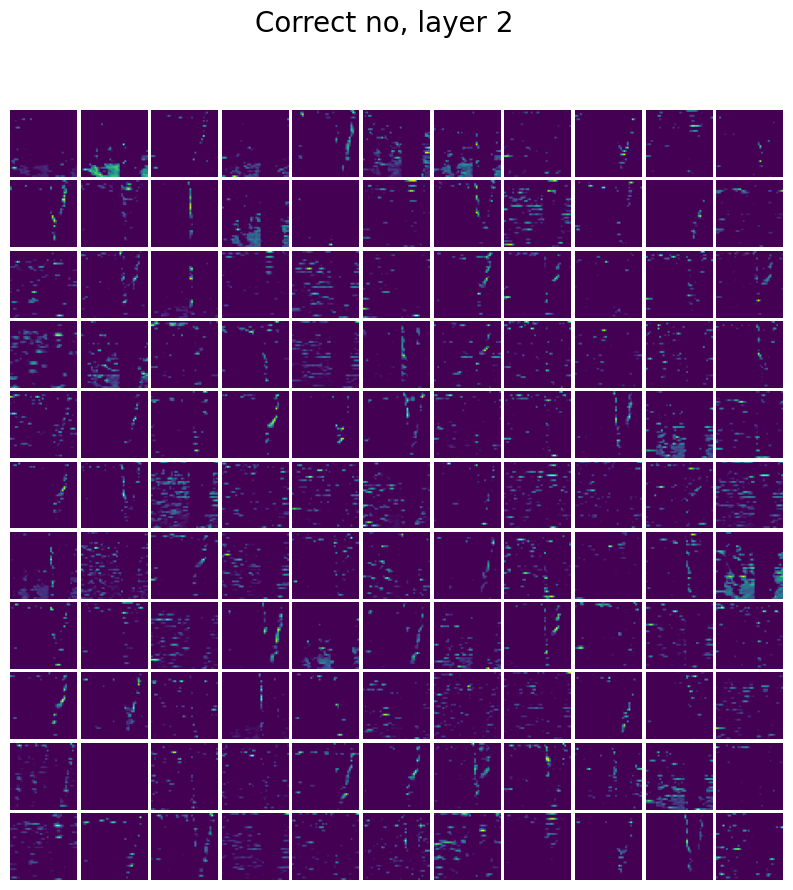

In [18]:
conv_activations = compute_activations(correct["no"][[0]], activations)
print_activation(conv_activations[2], "Correct no, layer 2")

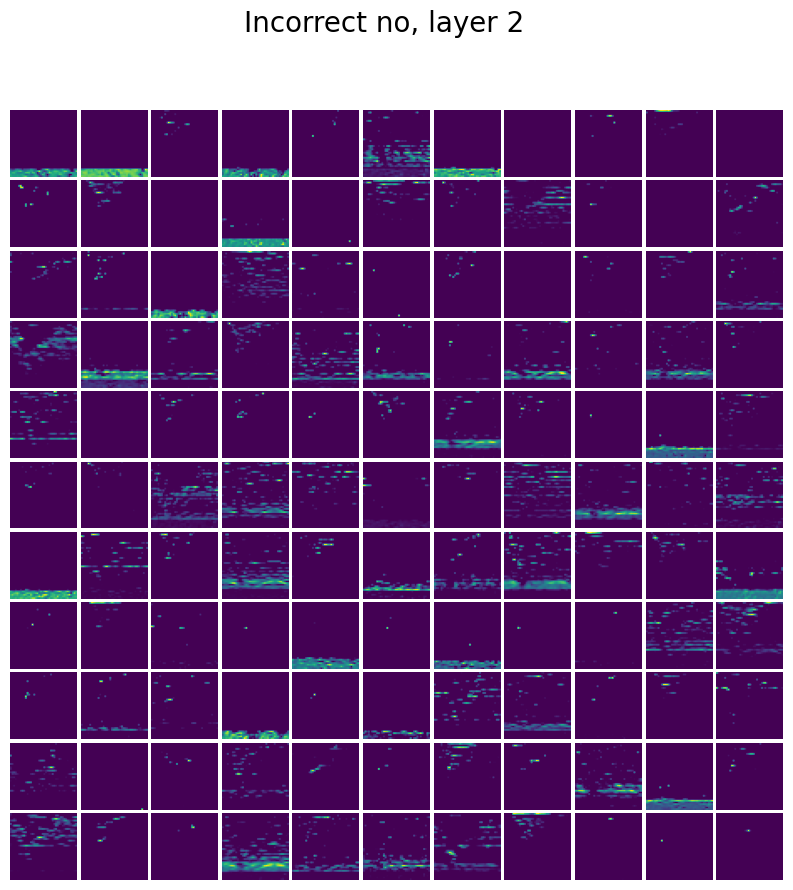

In [19]:
conv_activations = compute_activations(incorrect["no"][[0]], activations)
print_activation(conv_activations[2], "Incorrect no, layer 2")

In [20]:
correct_conv_avgs = compute_average_activations(correct["no"], activations)
incorrect_conv_avgs = compute_average_activations(incorrect["no"], activations)

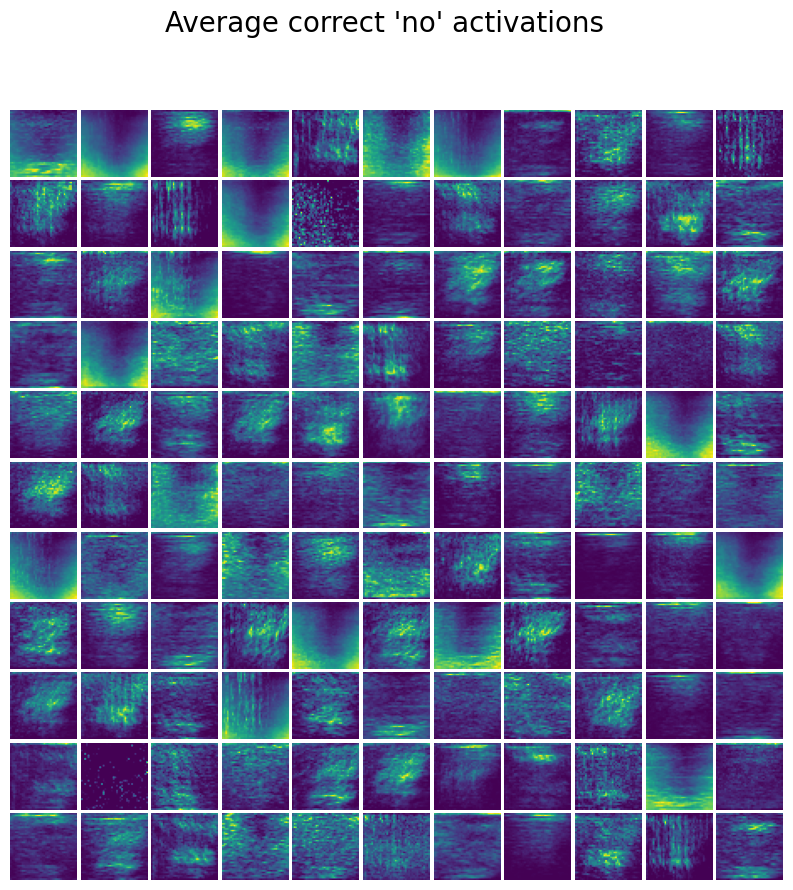

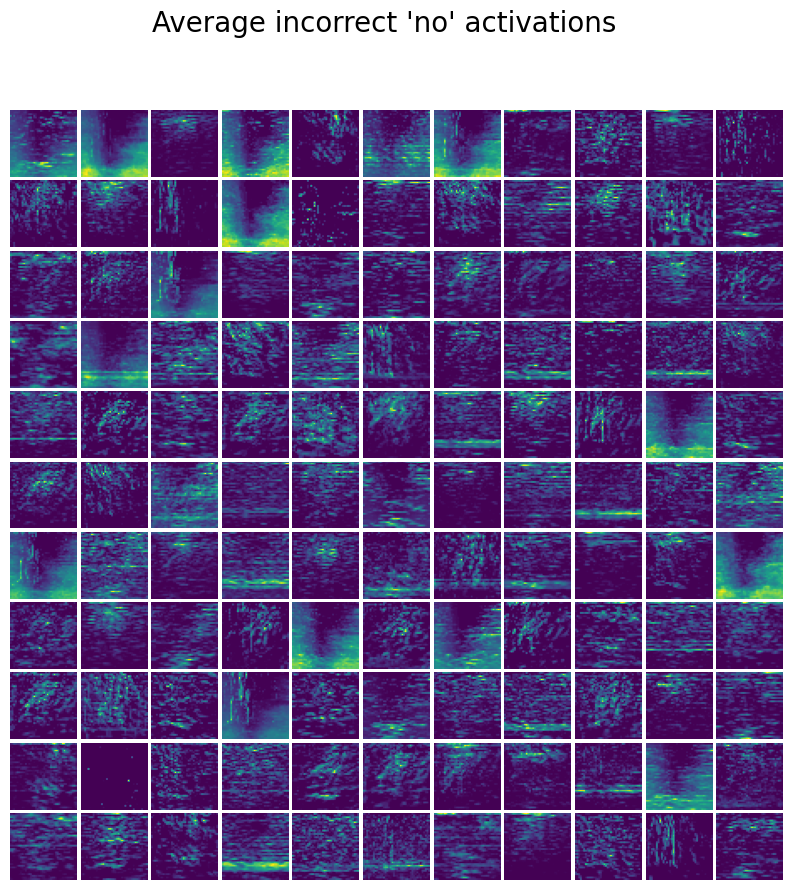

In [21]:
print_activation(correct_conv_avgs[2], "Average correct 'no' activations")
print_activation(incorrect_conv_avgs[2], "Average incorrect 'no' activations")

In [26]:
diff_avgs = get_diff_avg_activaions(correct_conv_avgs, incorrect_conv_avgs)

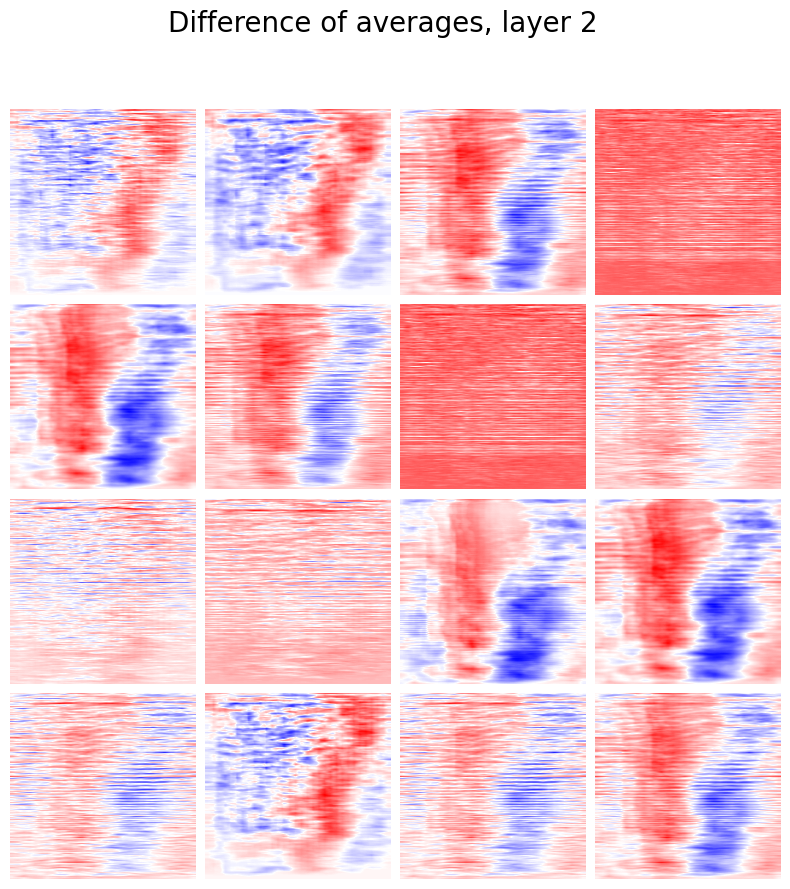

In [24]:
print_activation(diff_avgs[0], "Difference of averages, layer 2", cmap="bwr")

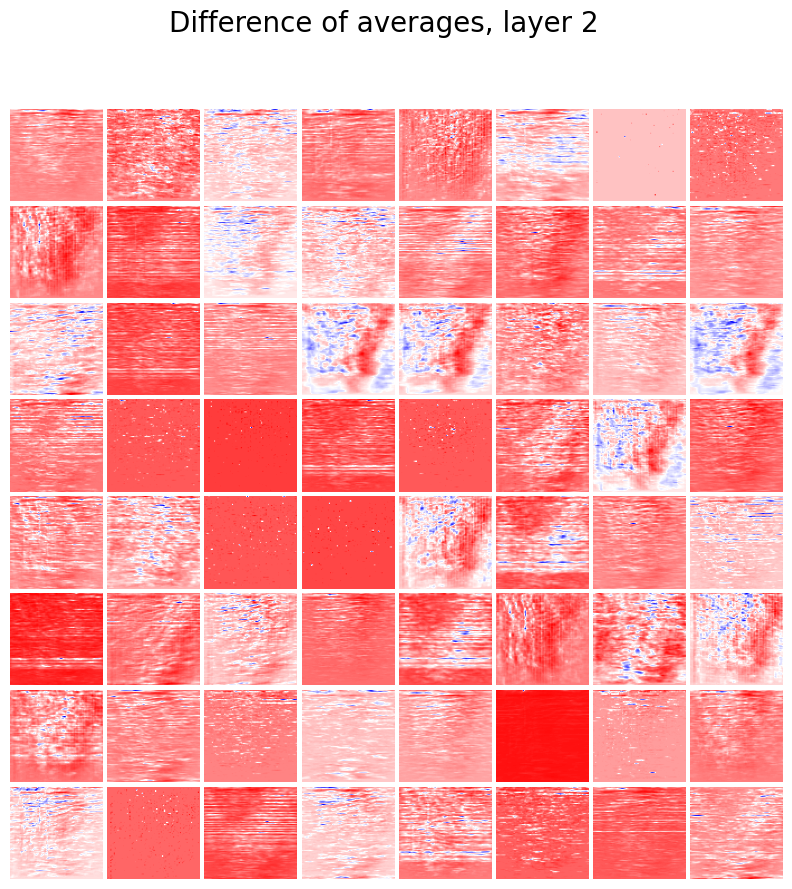

In [29]:
print_activation(diff_avgs[1], "Difference of averages, layer 2", cmap="bwr")

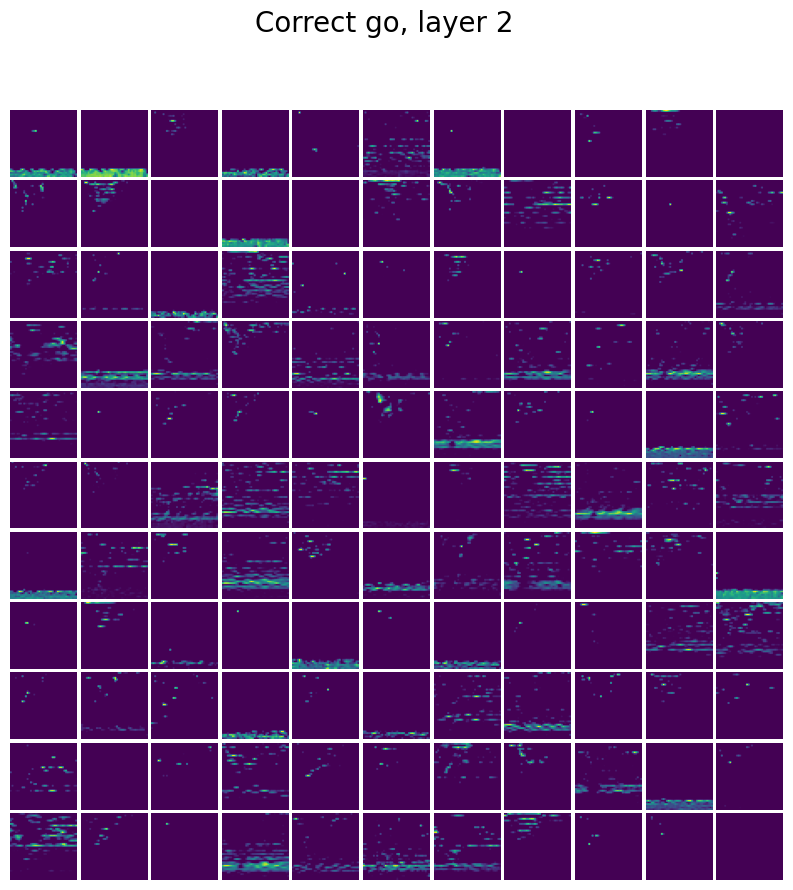

In [150]:
conv_activations = compute_activations(correct["go"][[0]], activations)
print_activation(conv_activations[2], "Correct go, layer 2")

The same vertical bars appear at correctly classified 'go' samples.

In [162]:
correct_conv_avgs = compute_average_activations(correct["go"], activations)
incorrect_conv_avgs = compute_average_activations(incorrect["go"], activations)

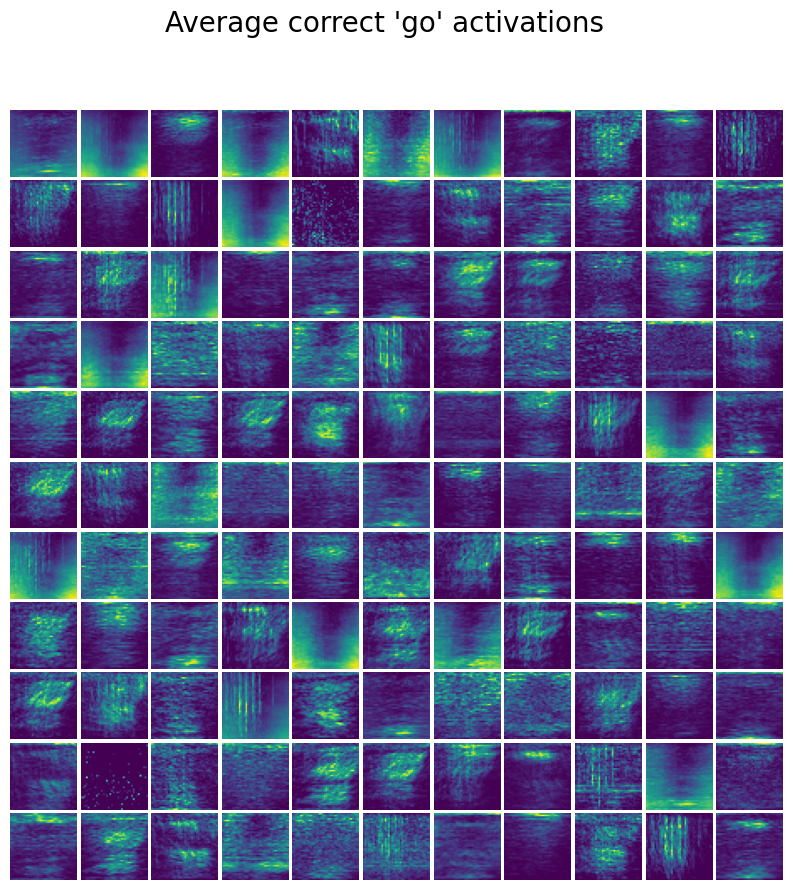

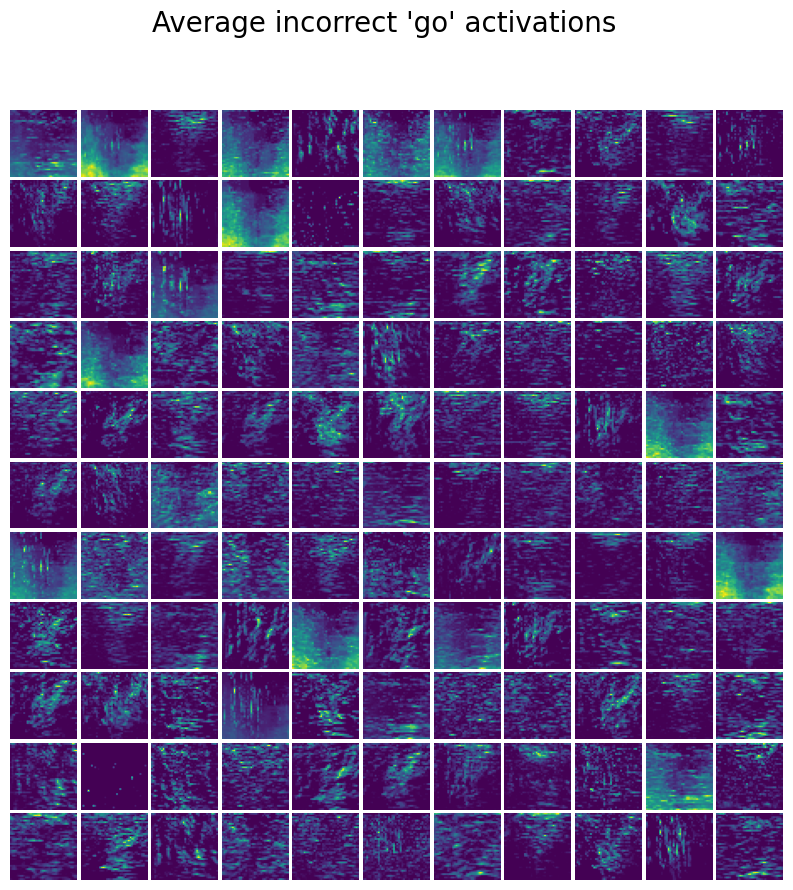

In [171]:
print_activation(correct_conv_avgs[2], "Average correct 'go' activations")
print_activation(incorrect_conv_avgs[2], "Average incorrect 'go' activations")

In [164]:
diff_avgs = get_diff_avg_activaions(correct_conv_avgs, incorrect_conv_avgs)

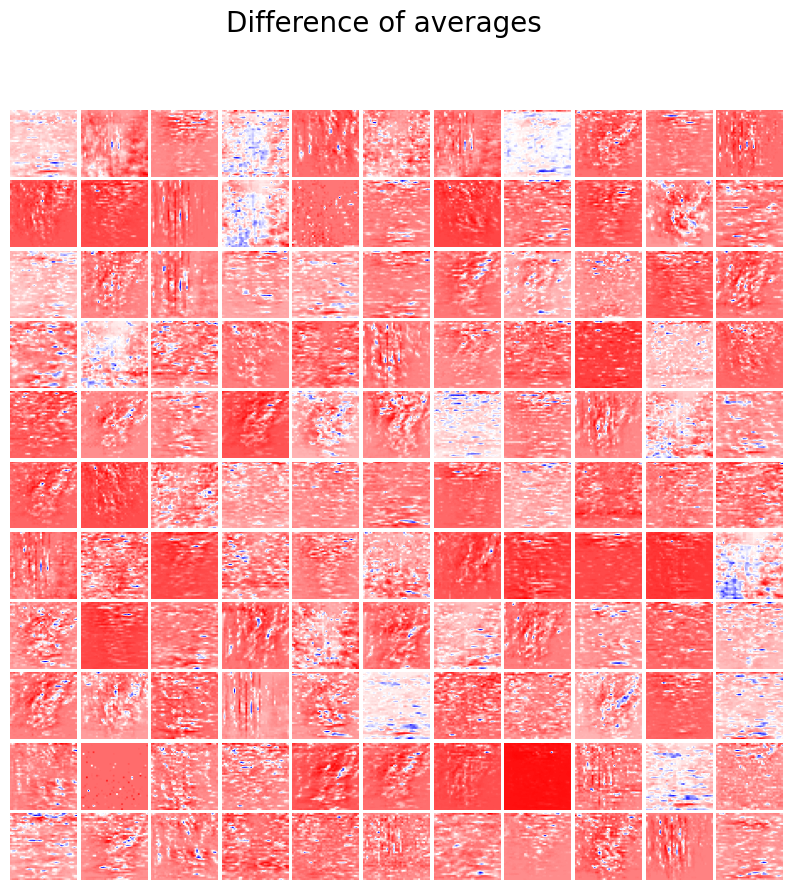

In [172]:
print_activation(diff_avgs[2], "Difference of averages", cmap="bwr")

Hard to say here :/

## 2. Dog vs down
Sound quite simmilar, big assymetry in confusion matrix:

In [29]:
cur_labels = ["dog", "down"]
cm_df[cur_labels].loc[cur_labels]

,dog,down
dog,111,25
down,6,204


In [30]:
correct, incorrect = correct_incorrect_split(ds_valid, cur_labels)
print(correct["dog"].shape, incorrect["dog"].shape)
print(correct["down"].shape, incorrect["down"].shape)

2024-11-27 19:26:41.125240: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


(111, 256, 256, 1) (25, 256, 256, 1)
(204, 256, 256, 1) (6, 256, 256, 1)


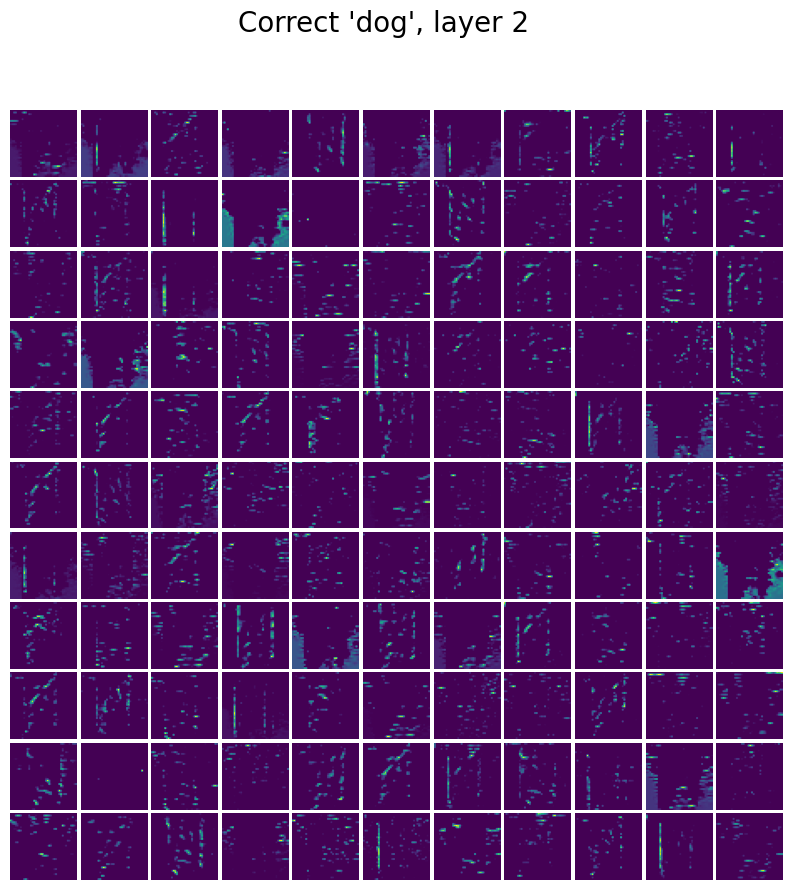

In [31]:
conv_activations = compute_activations(correct["dog"][[2]], activations)
print_activation(conv_activations[2], "Correct 'dog', layer 2")

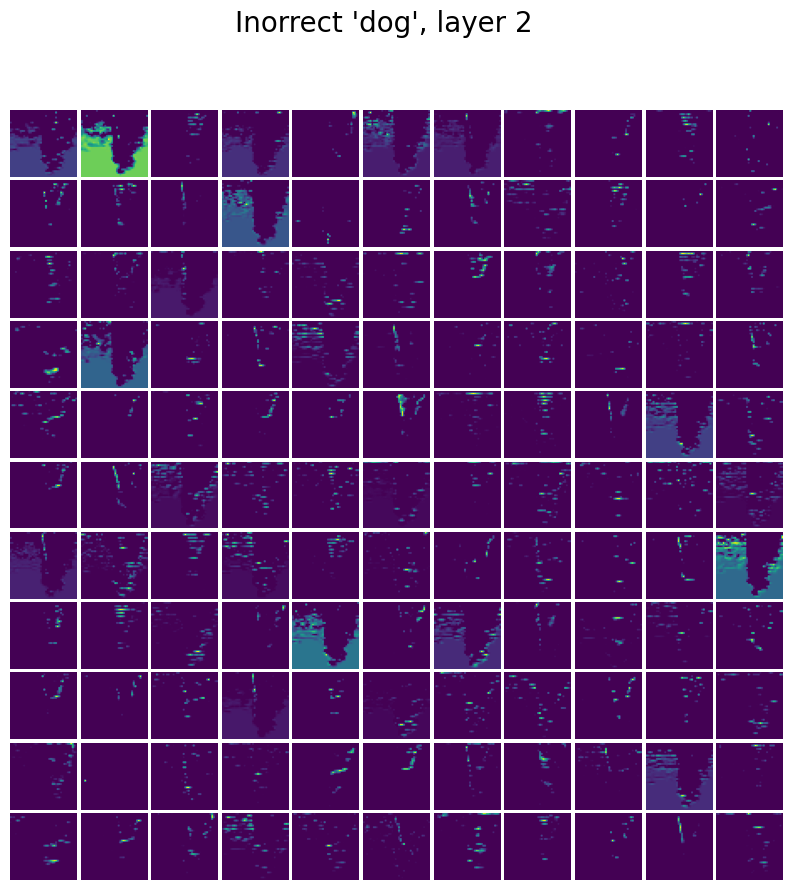

In [33]:
conv_activations = compute_activations(incorrect["dog"][[0]], activations)
print_activation(conv_activations[2], "Inorrect 'dog', layer 2")

In [34]:
correct_conv_avgs = compute_average_activations(correct["dog"], activations)
incorrect_conv_avgs = compute_average_activations(incorrect["dog"], activations)

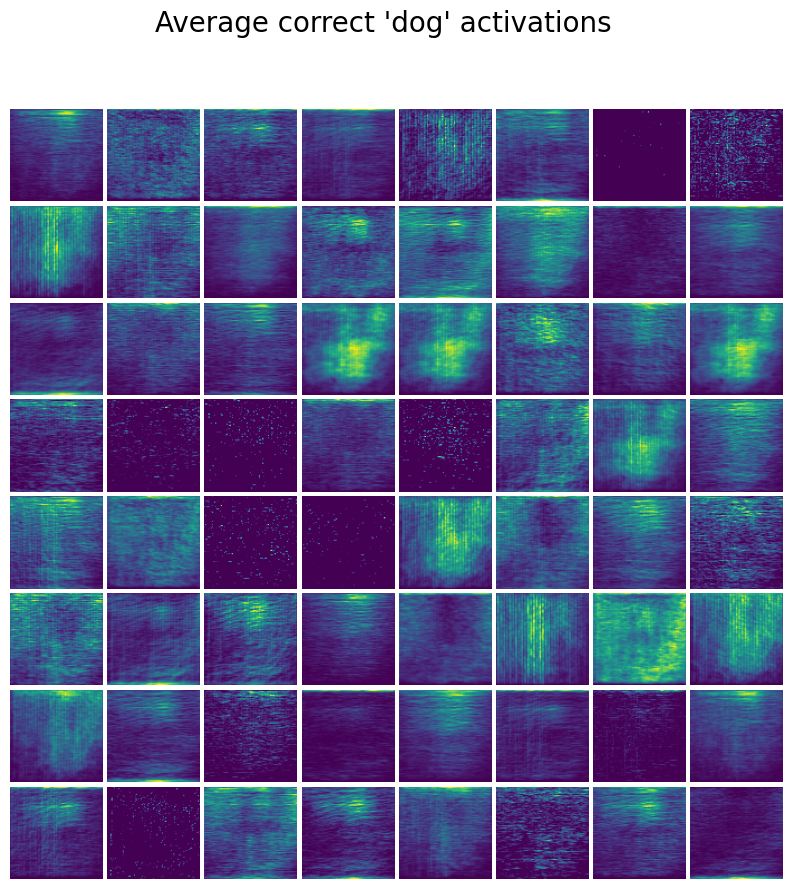

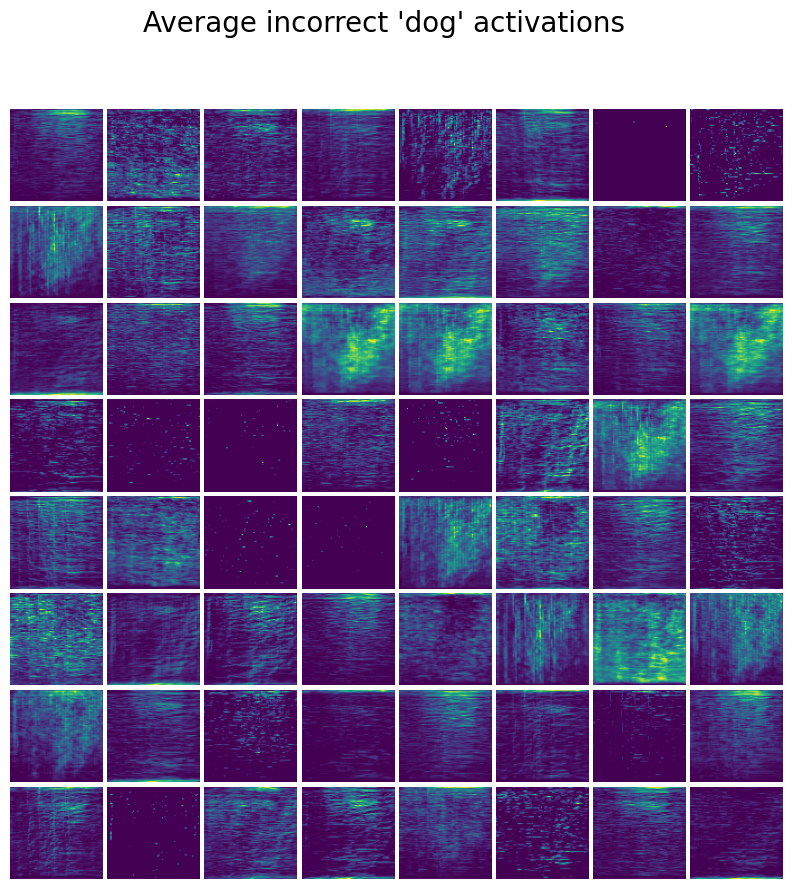

In [35]:
print_activation(correct_conv_avgs[1], "Average correct 'dog' activations")
print_activation(incorrect_conv_avgs[1], "Average incorrect 'dog' activations")

It seems like model learned to classify by taking into consideration the time in which word was spoken.
It is very plausible since there was no random crop or other augmentation to prevent this kind of overfitting.

Difference of averages should be some kind of gradient.

In [36]:
diff_avgs = get_diff_avg_activaions(correct_conv_avgs, incorrect_conv_avgs)

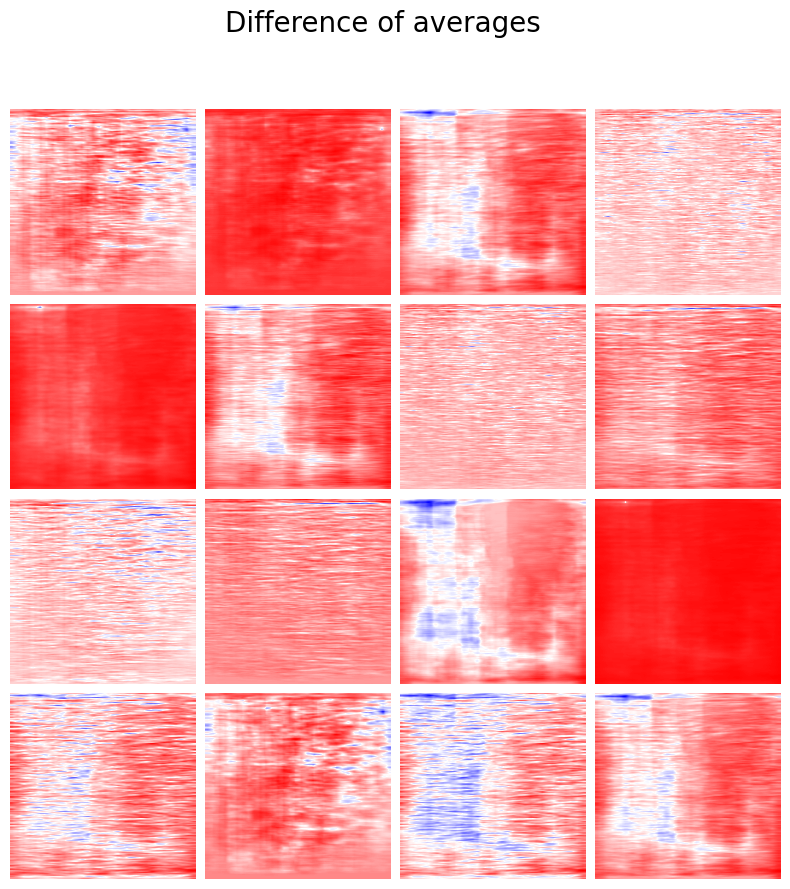

In [39]:
print_activation(diff_avgs[0], "Difference of averages", cmap="bwr")

## 3. Five vs on
Completely different sounds, different lengths of words, big assymetry of confusion.

In [40]:
cur_labels = ["five", "on"]
cm_df[cur_labels].loc[cur_labels]

,five,on
five,171,22
on,8,205


In [41]:
correct, incorrect = correct_incorrect_split(ds_valid, cur_labels)
print(correct["five"].shape, incorrect["five"].shape)
print(correct["on"].shape, incorrect["on"].shape)

(171, 256, 256, 1) (22, 256, 256, 1)
(205, 256, 256, 1) (8, 256, 256, 1)


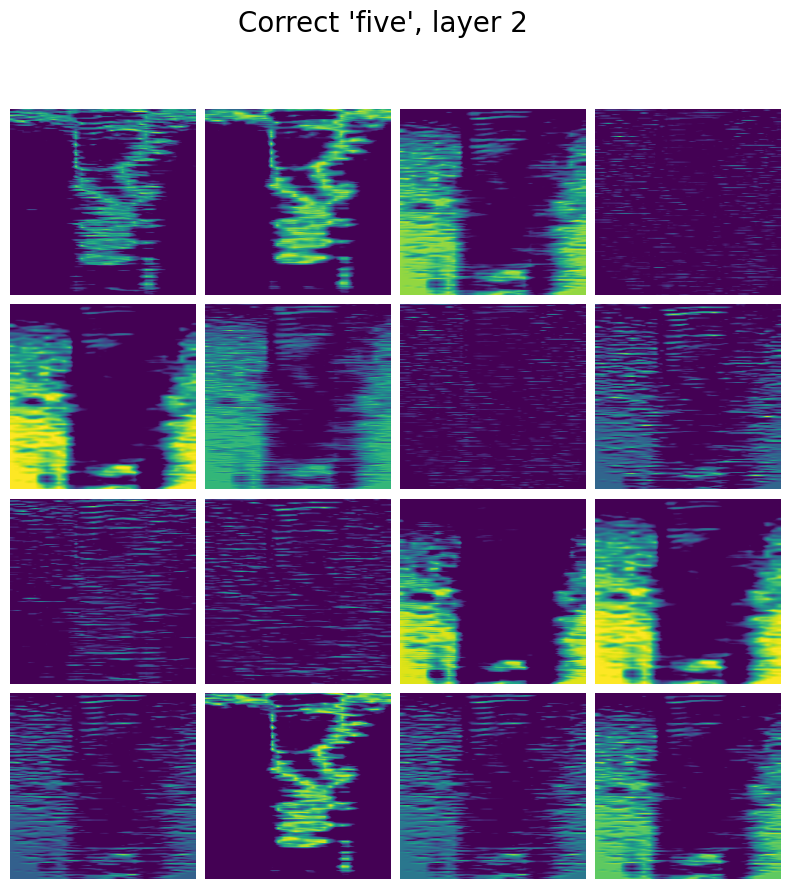

In [42]:
conv_activations = compute_activations(correct["five"][[150]], activations)
print_activation(conv_activations[0], "Correct 'five', layer 2")

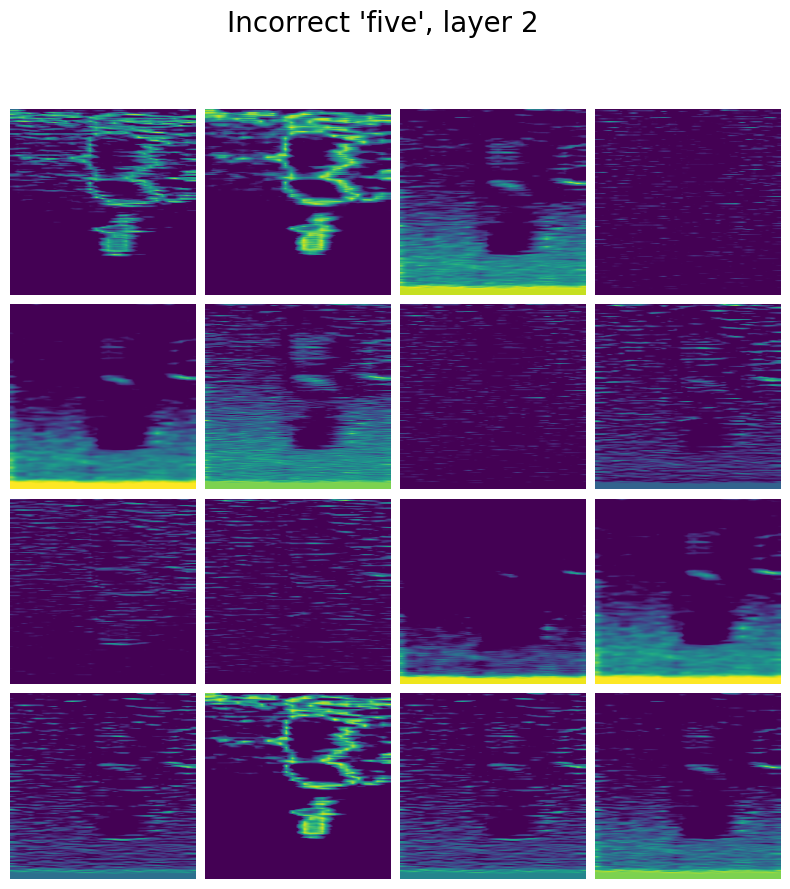

In [43]:
conv_activations = compute_activations(incorrect["five"][[2]], activations)
print_activation(conv_activations[0], "Incorrect 'five', layer 2")

In [44]:
correct_conv_avgs = compute_average_activations(correct["five"], activations)
incorrect_conv_avgs = compute_average_activations(incorrect["five"], activations)

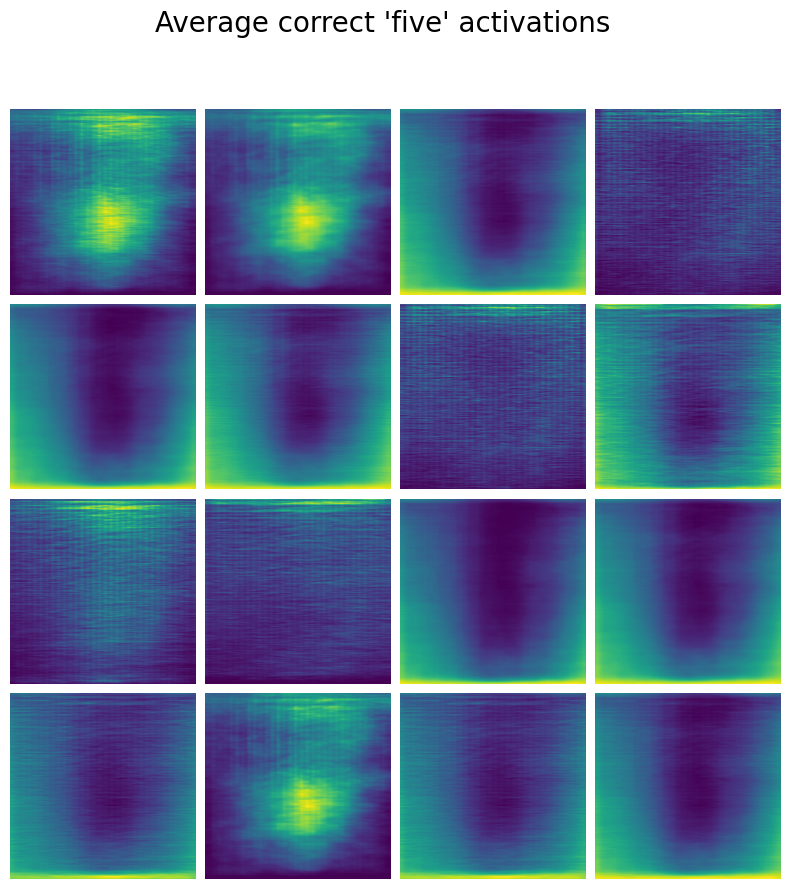

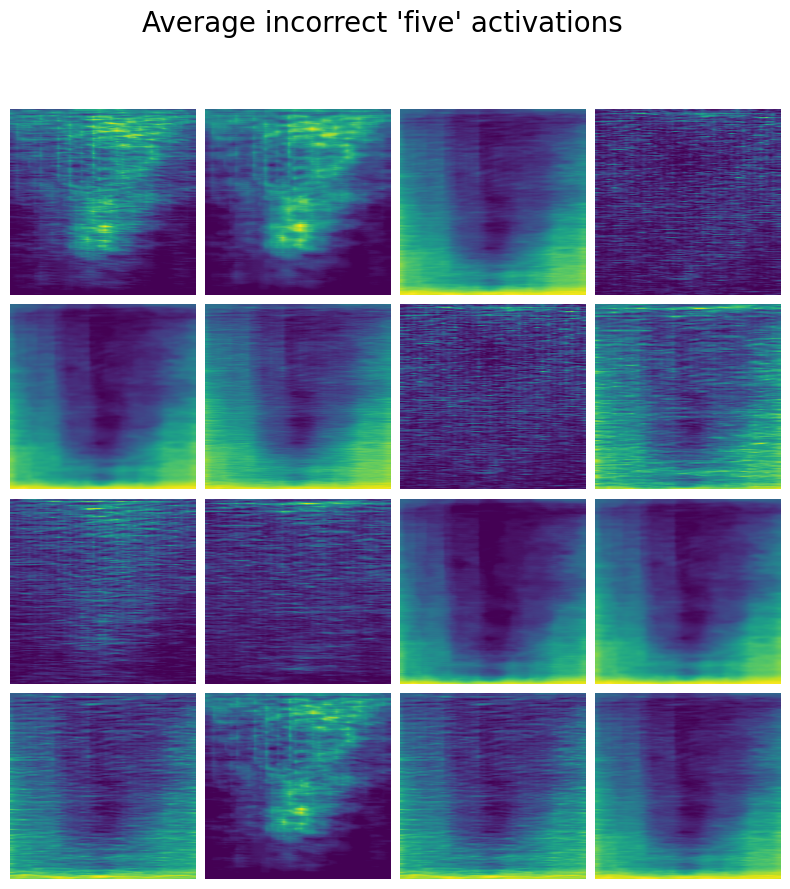

In [45]:
print_activation(correct_conv_avgs[0], "Average correct 'five' activations")
print_activation(incorrect_conv_avgs[0], "Average incorrect 'five' activations")

In [46]:
diff_avgs = get_diff_avg_activaions(correct_conv_avgs, incorrect_conv_avgs)

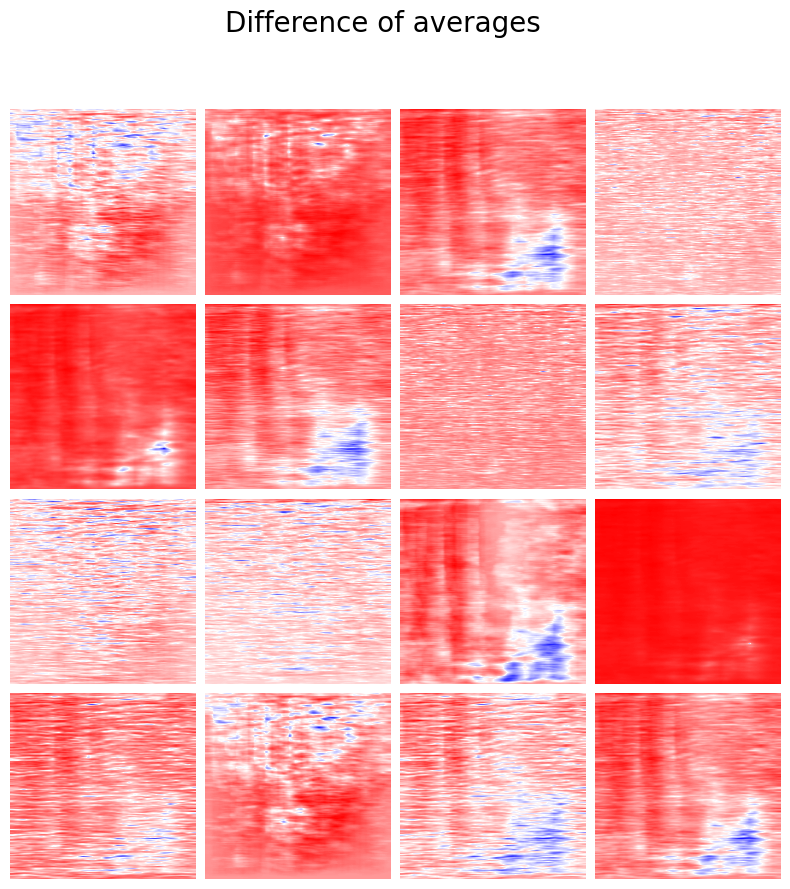

In [47]:
print_activation(diff_avgs[0], "Difference of averages", cmap="bwr")

### Inspecting 'on' classifier

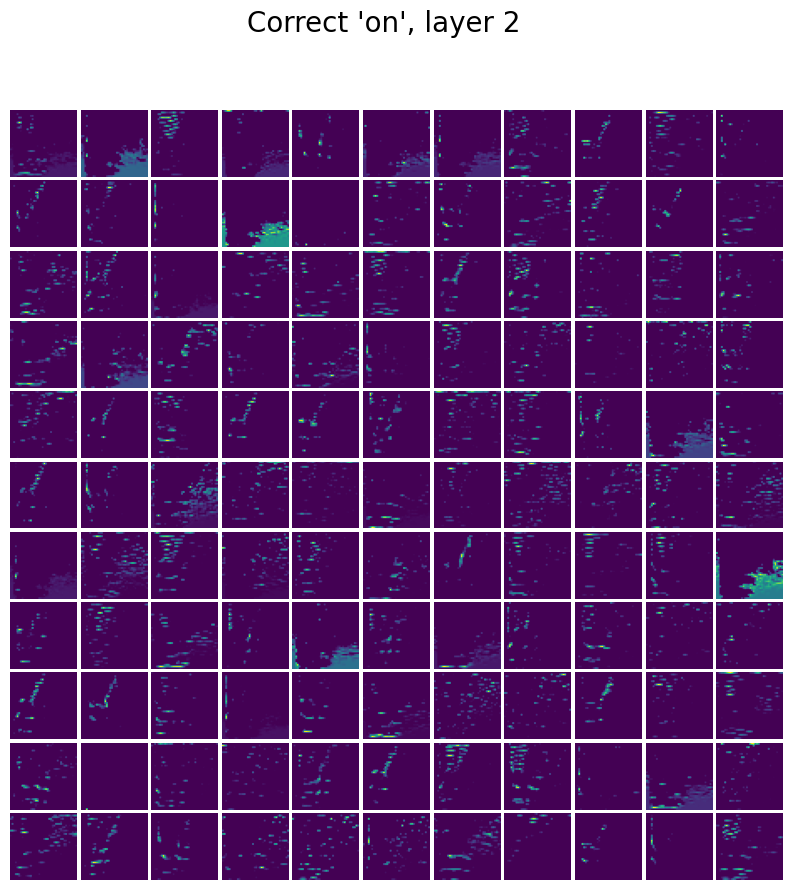

In [225]:
conv_activations = compute_activations(correct["on"][[2]], activations)
print_activation(conv_activations[2], "Correct 'on', layer 2")

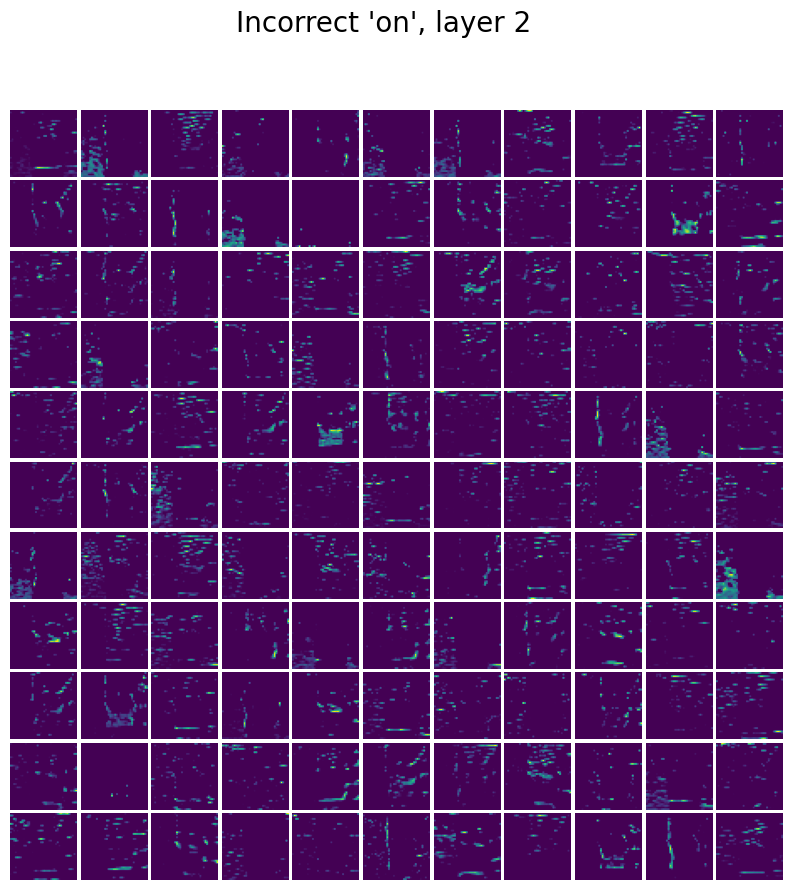

In [219]:
conv_activations = compute_activations(incorrect["on"][[2]], activations)
print_activation(conv_activations[2], "Incorrect 'on', layer 2")

In [252]:
correct_conv_avgs = compute_average_activations(correct["on"], activations)
incorrect_conv_avgs = compute_average_activations(incorrect["on"], activations)

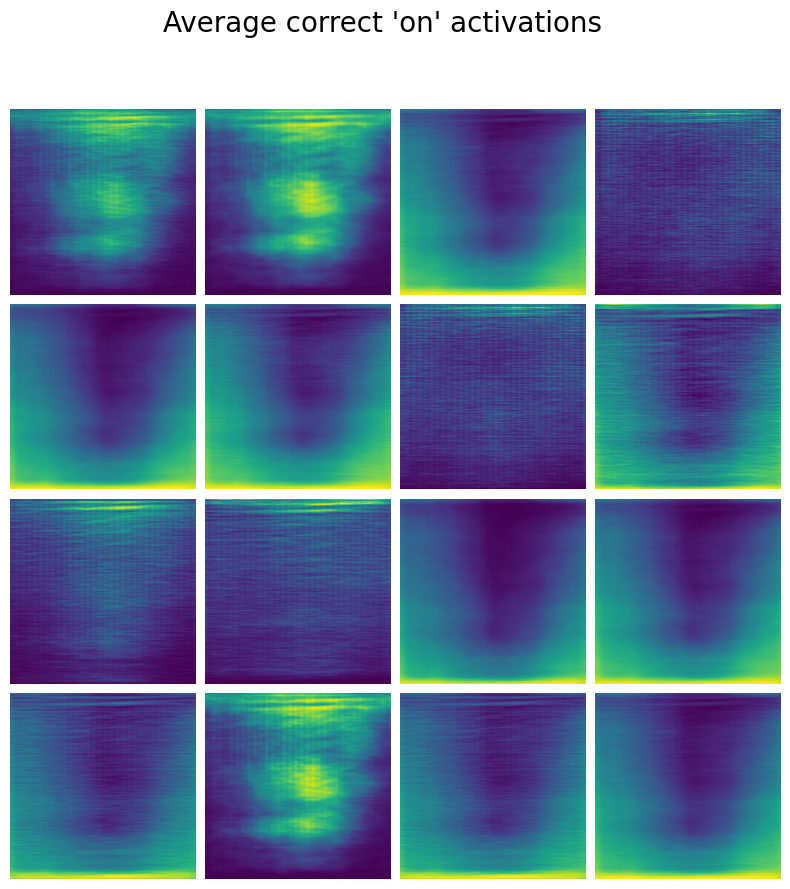

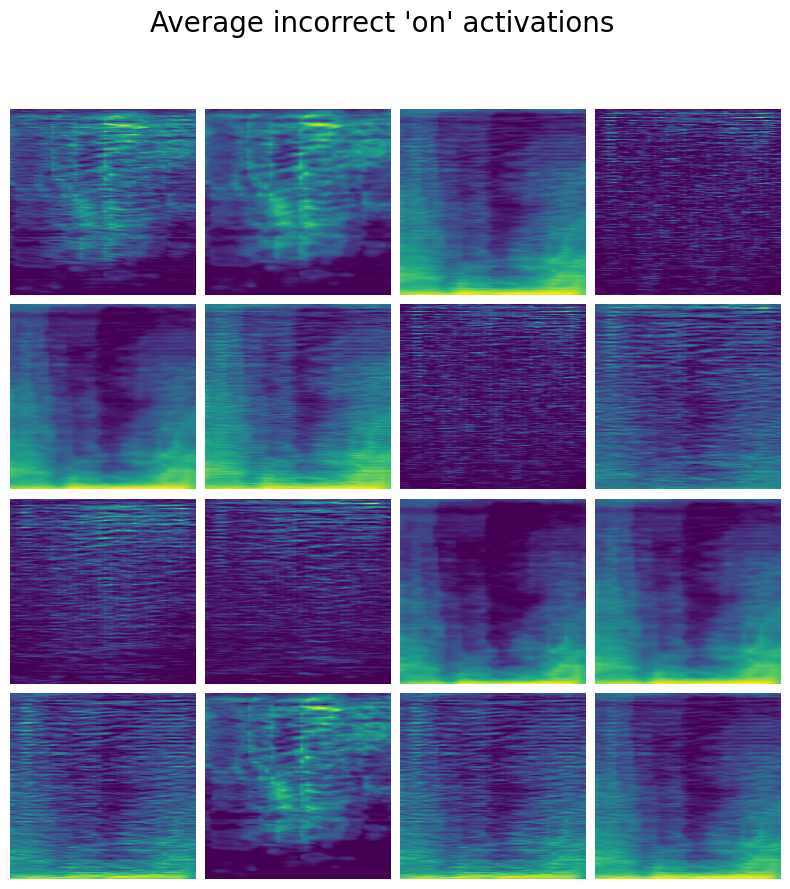

In [256]:
print_activation(correct_conv_avgs[0], "Average correct 'on' activations")
print_activation(incorrect_conv_avgs[0], "Average incorrect 'on' activations")

In [254]:
diff_avgs = get_diff_avg_activaions(correct_conv_avgs, incorrect_conv_avgs)

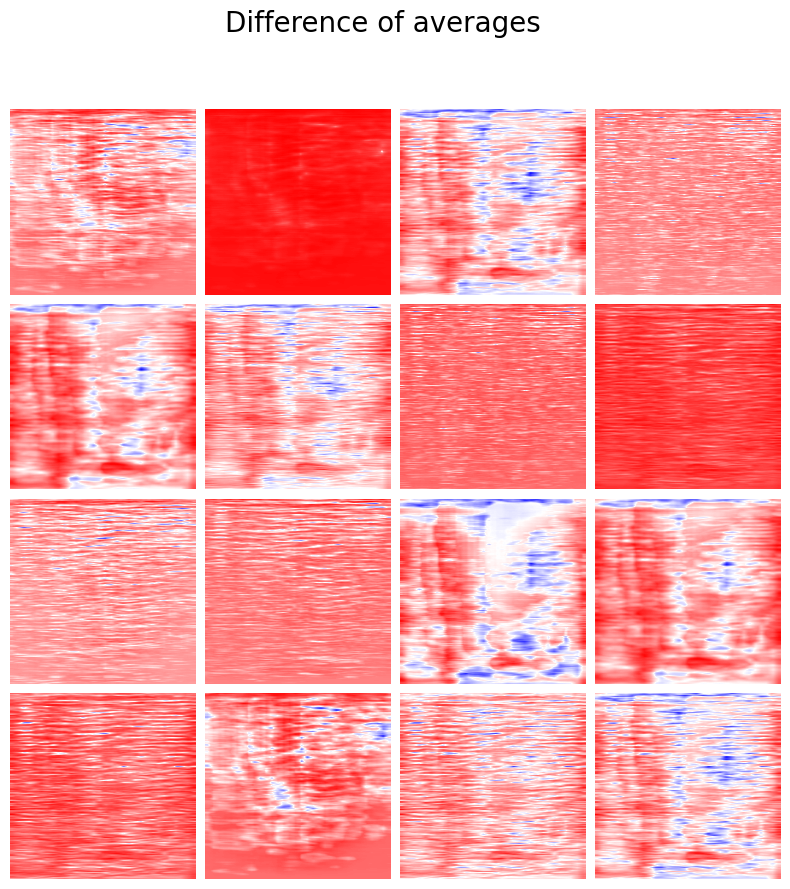

In [255]:
print_activation(diff_avgs[0], "Difference of averages", cmap="bwr")

One of the possible explanations is that classifier learns the length of the word. Because there is
a tendency for a word to be on the left side of the spectrogram, the fives spoken earlier and faster
might be classified as 'on'.

## Grad-CAM

In [3]:
def get_gradcam(model_path: str, layer_name: str) -> keras.Model:
    model: keras.Model = keras.saving.load_model(model_path)
    model.layers[-1].activation = None
    gradcam = keras.Model(inputs=model.inputs, outputs=[model.output, model.get_layer(layer_name).output])
    return gradcam

In [4]:
def get_heatmap(gradcam: keras.Model, X: np.ndarray, class_name: int | str | None = None) -> np.ndarray:
    if type(class_name) is str:
        class_name = class_dict[class_name]

    with tf.GradientTape() as tape:
        pred, conv_output = gradcam(X)
        if class_name is None:
            class_name = tf.argmax(pred)
        class_channel = pred[:, class_name]

    grads = tape.gradient(class_channel, conv_output)

    feature_importance = tf.reduce_mean(grads, axis=(0, 1, 2))
    feature_importance = tf.expand_dims(feature_importance, axis=1)

    weighted_feature_map = tf.matmul(conv_output, feature_importance)

    heatmap = tf.maximum(weighted_feature_map, 0) / tf.reduce_max(weighted_feature_map)
    heatmap = tf.squeeze(heatmap)
    return heatmap

In [5]:
def get_counterfactual_heatmap(
        gradcam: keras.Model,
        X: np.ndarray,
        class_name: int | str | None = None
) -> np.ndarray:
    if type(class_name) is str:
        class_name = class_dict[class_name]

    with tf.GradientTape() as tape:
        pred, conv_output = gradcam(X)
        if class_name is None:
            class_name = tf.argmax(pred)
        class_channel = pred[:, class_name]

    grads = tape.gradient(class_channel, conv_output)

    feature_importance = tf.reduce_mean(-grads, axis=(0, 1, 2))
    feature_importance = tf.expand_dims(feature_importance, axis=1)

    weighted_feature_map = tf.matmul(conv_output, feature_importance)

    heatmap = tf.maximum(weighted_feature_map, 0) / tf.reduce_max(weighted_feature_map)
    heatmap = tf.squeeze(heatmap)
    return heatmap

In [6]:
def display_gradcam(img_array, heatmap):
    alpha = 0.4
    heatmap = np.uint8(heatmap * 255.0)
    jet = mpl.colormaps["jet"]

    jet_colors = jet(np.arange(256))[:, :3]
    jet_heatmap = jet_colors[heatmap]

    jet_heatmap = keras.utils.array_to_img(jet_heatmap)
    jet_heatmap = jet_heatmap.resize((img_array.shape[1], img_array.shape[0]))
    jet_heatmap = keras.utils.img_to_array(jet_heatmap)

    superimposed_img = jet_heatmap * alpha + img_array
    superimposed_img = keras.utils.array_to_img(superimposed_img)
    plt.imshow(superimposed_img)

In [9]:
normalized_model_path = os.path.join(MODEL_PATH, "NormalizedCNN.keras")
model: keras.Model = keras.saving.load_model(normalized_model_path)
model.summary()
correct, incorrect = correct_incorrect_split(model, ds_valid, ["no", "go"])
print(correct["no"].shape, incorrect["no"].shape)
print(correct["go"].shape, incorrect["go"].shape)
gradcam = get_gradcam(normalized_model_path, "average_pooling2d_14")

Model: "NormalizedCNN"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (32, 256, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_14 (Reshape)            │ (32, 256, 256, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization_18                │ (32, 256, 256, 1)      │             3 │
│ (Normalization)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_42 (Conv2D)              │ (32, 254, 254, 16)     │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (32, 84, 84, 16)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (32, 83, 83, 64)       │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (32, 41, 41, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (32, 40, 40, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ average_pooling2d_14            │ (32, 20, 20, 128)      │             0 │
│ (AveragePooling2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (32, 51200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (32, 256)              │    13,107,456 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (32, 256)              │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (32, 30)               │         7,710 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 13,218,178 (50.42 MB)

 Trainable params: 13,218,174 (50.42 MB)

 Non-trainable params: 3 (16.00 B)

 Optimizer params: 1 (8.00 B)

2024-12-12 15:17:12.307023: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-12-12 15:17:12.988302: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2024-12-12 15:17:14.291200: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
I0000 00:00:1734013034.528900   12896 service.cc:148] XLA service 0x7ff928014e70 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1734013034.529668   12896 service.cc:156]   StreamExecutor device (0): NVIDIA GeForce RTX 3060 Laptop GPU, Compute Capability 8.6
2024-12-12 15:17:14.548032: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1734013034.597947   12896 cuda_dn

(205, 256, 256, 1) (25, 256, 256, 1)
(179, 256, 256, 1) (24, 256, 256, 1)


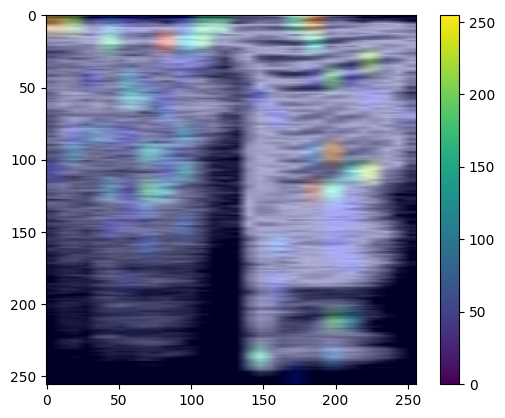

In [24]:
img_array = incorrect["go"][[6]]
heatmap = get_heatmap(gradcam, img_array, "go")
display_gradcam(img_array[0], heatmap)
plt.colorbar()

In [48]:
myalex_model_path = os.path.join(MODEL_PATH, "MyAlexNet_opt-SGD_exp_decay_lr-0.001_steps-10000_rate-0.9_momentum-0.9.keras")
myalex_model = keras.saving.load_model(myalex_model_path)
myalex_model.summary()

Model: "MyAlexNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_6 (InputLayer)      │ (32, 256, 256)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape_6 (Reshape)             │ (32, 256, 256, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ normalization_1 (Normalization) │ (32, 256, 256, 1)      │             3 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_crop_6 (RandomCrop)      │ (32, 227, 227, 1)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_36 (Conv2D)              │ (32, 113, 113, 128)    │         1,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (32, 56, 56, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_38 (Conv2D)              │ (32, 54, 54, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_24          │ (32, 54, 54, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_24 (ReLU)                 │ (32, 54, 54, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (32, 26, 26, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_39 (Conv2D)              │ (32, 24, 24, 128)      │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_25          │ (32, 24, 24, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_25 (ReLU)                 │ (32, 24, 24, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (32, 11, 11, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_40 (Conv2D)              │ (32, 5, 5, 256)        │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_26          │ (32, 5, 5, 256)        │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_26 (ReLU)                 │ (32, 5, 5, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (32, 4, 4, 256)        │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_27          │ (32, 4, 4, 256)        │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu_27 (ReLU)                 │ (32, 4, 4, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (32, 2, 2, 256)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (32, 1024)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (32, 256)              │       262,40

 Total params: 2,351,936 (8.97 MB)

 Trainable params: 1,175,198 (4.48 MB)

 Non-trainable params: 1,539 (6.02 KB)

 Optimizer params: 1,175,199 (4.48 MB)

In [49]:
correct, incorrect = correct_incorrect_split(myalex_model, ds_valid, ["dog", "down"])
print(correct["dog"].shape, incorrect["dog"].shape)
print(correct["down"].shape, incorrect["down"].shape)

2024-12-09 18:15:50.346089: I tensorflow/core/framework/local_rendezvous.cc:405] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


(136, 256, 256, 1) (19, 256, 256, 1)
(227, 256, 256, 1) (2, 256, 256, 1)


In [50]:
gradcam = get_gradcam(myalex_model_path, "max_pooling2d_19")

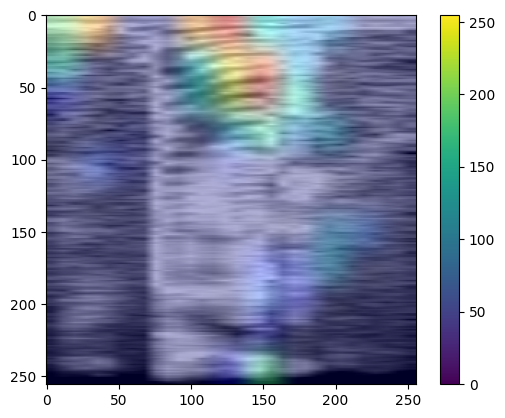

In [88]:
img_array = correct["dog"][[10]]
heatmap = get_heatmap(gradcam, img_array, "down")
display_gradcam(img_array[0], heatmap)
plt.colorbar()

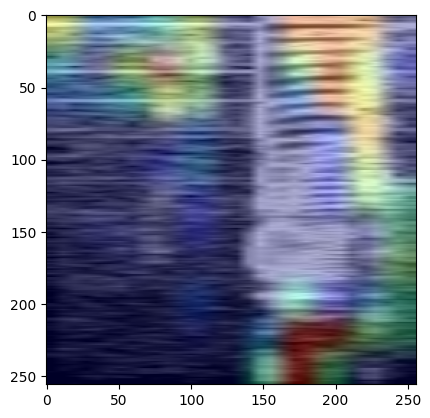

In [70]:
img_array = incorrect["dog"][[8]]
heatmap = get_counterfactual_heatmap(gradcam, img_array, "dog")
display_gradcam(img_array[0], heatmap)

### Average heatmaps

In [64]:
def get_average_heatmap(gradcam: keras.Model, X: np.ndarray, class_name: int | str | None = None, batch_size=32) -> np.ndarray:
    if type(class_name) is str:
        class_name = class_dict[class_name]

    heatmaps = []
    heatmaps_weights = []

    for batch in np.array_split(X, np.arange(batch_size, len(X), batch_size), axis=0):
        with tf.GradientTape() as tape:
            pred, conv_output = gradcam(batch)
            if class_name is None:
                class_name = tf.argmax(pred)
            class_channel = pred[:, class_name]

        grads = tape.gradient(class_channel, conv_output)

        feature_importance = tf.reduce_mean(grads, axis=(0, 1, 2))
        feature_importance = tf.expand_dims(feature_importance, axis=1)

        weighted_feature_map = tf.matmul(conv_output, feature_importance)
        heatmap = tf.maximum(weighted_feature_map, 0) / tf.reduce_max(weighted_feature_map)
        heatmap = tf.reduce_mean(heatmap, axis=0)
        heatmaps.append(tf.squeeze(heatmap).numpy())
        heatmaps_weights.append(len(batch))

    heatmaps = np.stack(heatmaps, 0)
    heatmap = np.average(heatmaps, axis=0, weights=heatmaps_weights)
    return heatmap

/home/kaszkiet/projects/IML_Voice_Recognition/.venv/lib/python3.12/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer_14']. Received: the structure of inputs=*
  warnings.warn(


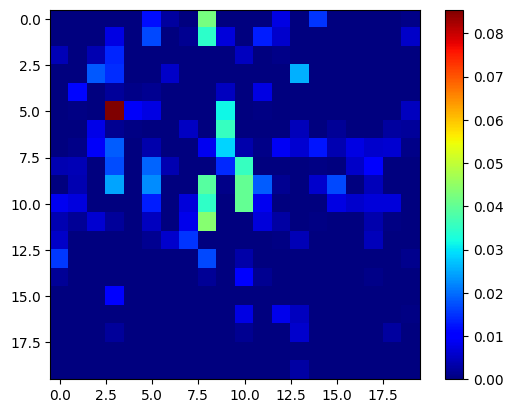

In [94]:
img_array = incorrect["go"]
heatmap_no = get_average_heatmap(gradcam, img_array, class_name="no")
plt.imshow(heatmap, cmap="jet")
plt.colorbar()
plt.show()

/home/kaszkiet/projects/IML_Voice_Recognition/.venv/lib/python3.12/site-packages/keras/src/models/functional.py:225: UserWarning: The structure of `inputs` doesn't match the expected structure: ['input_layer_14']. Received: the structure of inputs=*
  warnings.warn(


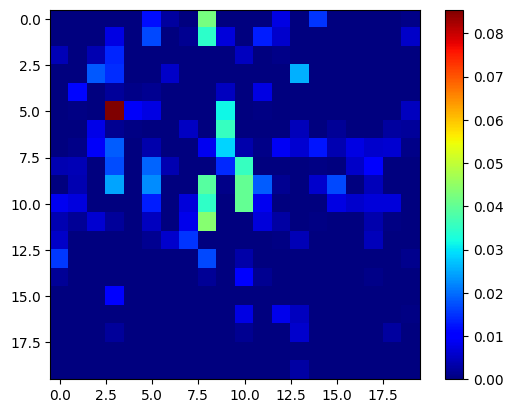

In [95]:
img_array = incorrect["go"]
heatmap_go = get_average_heatmap(gradcam, img_array, class_name="go")
plt.imshow(heatmap, cmap="jet")
plt.colorbar()
plt.show()

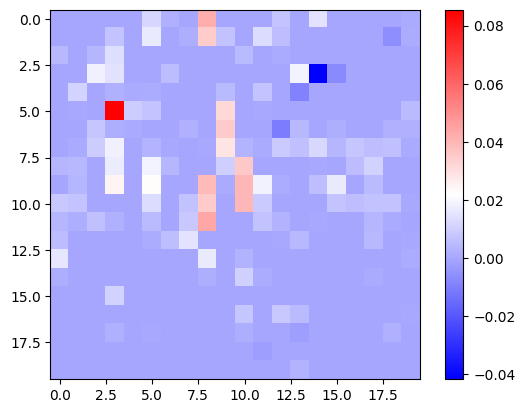

In [96]:
# Difference of the heatmaps
# Red regions correspond to active regions of word "go"
# Blue regions correspond to active regions of word "no"
plt.imshow(heatmap_go - heatmap_no, cmap="bwr")
plt.colorbar()
plt.show()

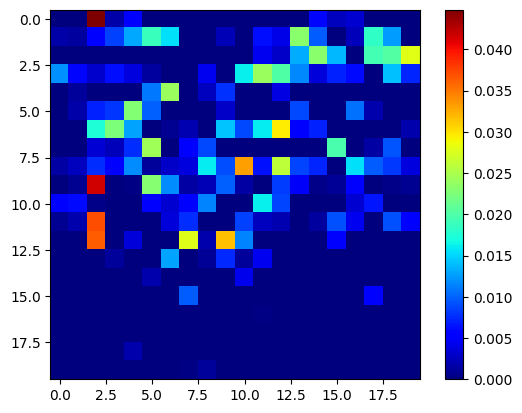

In [84]:
img_array = incorrect["no"]
heatmap = get_average_heatmap(gradcam, img_array, class_name="go")
plt.imshow(heatmap, cmap="jet")
plt.colorbar()
plt.show()